In [1]:
# This is the final notebook of the analysis of sporozoite data
# Basically it is divided in (1) cleaning the data/combining from different files,
# (2) the hmm model
# (3) fitting of Levy flights/power laws
# wosniack, June 2019

In [2]:
# loading libraries
library(moveHMM) # has the hmm package
library(ggplot2) # pretty plotting
library(quantmod) # finding peaks function
library(poweRlaw) # power law fitting
library(cowplot) # for grids
library(pracma)

Loading required package: CircStats

Loading required package: MASS

Loading required package: boot

Loading required package: xts

Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric


Registered S3 method overwritten by 'xts':
  method     from
  as.zoo.xts zoo 

Loading required package: TTR

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Version 0.4-0 included new data defaults. See ?getSymbols.


********************************************************

Note: As of version 1.0.0, cowplot does not change the

  default ggplot2 theme anymore. To recover the previous

  behavior, execute:
  theme_set(theme_cowplot())

********************************************************



Attaching package: ‘pracma’


The following object is masked from ‘package:boot’:

    logit




In [3]:
# reading the data files
cluster1 <- read.csv("data/cluster1_fix.csv")
cluster2 <- read.csv("data/cluster2_fix.csv")
cluster3 <- read.csv("data/cluster3_fix.csv")
file_20180206 <- read.csv2("data/20180206.csv")
file_20180216 <- read.csv("data/20180216.csv")
file_20180801 <- read.csv2("data/20180801.csv")

In [4]:
#
# discarding useless info and writing proper names
#
cluster1 <- subset(cluster1, select = c("X", "Y", "ID", 
                                        "Xvessel", "Yvessel", "Dvessel"))
#
cluster2 <- subset(cluster2, select = c("X", "Y", "ID", 
                                        "Xvessel", "Yvessel", "Dvessel"))
#
cluster3 <- subset(cluster3, select = c("X", "Y", "ID", 
                                        "Xvessel", "Yvessel", "Dvessel"))
#
file_20180206 <- subset(file_20180206, select = c("CID", "TID", "x..micron.", "y..micron."))
names(file_20180206) <- c("ClusterID", "TID", "X", "Y")
#
file_20180216 <- subset(file_20180216, select = c("CID", "TID", "x..micron.", "y..micron."))
names(file_20180216) <- c("ClusterID", "TID", "X", "Y")
#
file_20180801 <- subset(file_20180801, select = c("CID", "TID", "x..micron.", "y..micron."))
names(file_20180801) <- c("ClusterID", "TID", "X", "Y")
#

In [5]:
#
# fixing factors vs num.. annoying!
#
file_20180206$ClusterID <- as.factor(file_20180206$ClusterID)
file_20180206$TID <- as.factor(file_20180206$TID)
file_20180206$X <- as.numeric(as.character(file_20180206$X))
file_20180206$Y <- as.numeric(as.character(file_20180206$Y))
#
file_20180216$ClusterID <- as.factor(file_20180216$ClusterID)
file_20180216$TID <- as.factor(file_20180216$TID)
file_20180216$X <- as.numeric(as.character(file_20180216$X))
file_20180216$Y <- as.numeric(as.character(file_20180216$Y))
#
file_20180801$ClusterID <- as.factor(file_20180801$ClusterID)
file_20180801$TID <- as.factor(file_20180801$TID)
file_20180801$X <- as.numeric(as.character(file_20180801$X))
file_20180801$Y <- as.numeric(as.character(file_20180801$Y))

In [6]:
# here ID should be as factors... and we will add the cluster number in 
# front of ID number just to have unique iDs..
cluster1$ID <- as.factor(paste('1-', cluster1$ID, sep = ""))
cluster2$ID <- as.factor(paste('2-', cluster2$ID, sep = ""))
cluster3$ID <- as.factor(paste('3-', cluster3$ID, sep = ""))
#
file_20180206$ID <- as.factor(paste('20180206-', file_20180206$ClusterID,'-',file_20180206$TID, sep = ""))
file_20180216$ID <- as.factor(paste('20180216-', file_20180216$ClusterID,'-',file_20180216$TID, sep = ""))
file_20180801$ID <- as.factor(paste('20180801-', file_20180801$ClusterID,'-',file_20180801$TID, sep = ""))
#
cluster1$ClusterID <- as.factor(1)
cluster2$ClusterID <- as.factor(2)
cluster3$ClusterID <- as.factor(3)

In [7]:
#
# we are going to calculate the individual displacements...
# cluster 1
cluster1$StepX <- NaN
vec_dx <- cluster1$X[2:nrow(cluster1)] - cluster1$X[1:nrow(cluster1) - 1]
cluster1$StepX[2:nrow(cluster1)] <- abs(vec_dx)
cluster1$StepY <- NaN
vec_dy <- cluster1$Y[2:nrow(cluster1)] - cluster1$Y[1:nrow(cluster1) - 1]
cluster1$StepY[2:nrow(cluster1)] <- abs(vec_dy)
#
# cluster 2
#
cluster2$StepX <- NaN
vec_dx <- cluster2$X[2:nrow(cluster2)] - cluster2$X[1:nrow(cluster2) - 1]
cluster2$StepX[2:nrow(cluster2)] <- abs(vec_dx)
cluster2$StepY <- NaN
vec_dy <- cluster2$Y[2:nrow(cluster2)] - cluster2$Y[1:nrow(cluster2) - 1]
cluster2$StepY[2:nrow(cluster2)] <- abs(vec_dy)
#
# cluster 3
#
cluster3$StepX <- NaN
vec_dx <- cluster3$X[2:nrow(cluster3)] - cluster3$X[1:nrow(cluster3) - 1]
cluster3$StepX[2:nrow(cluster3)] <- abs(vec_dx)
cluster3$StepY <- NaN
vec_dy <- cluster3$Y[2:nrow(cluster3)] - cluster3$Y[1:nrow(cluster3) - 1]
cluster3$StepY[2:nrow(cluster3)] <- abs(vec_dy)
#
# file 20180206
#
file_20180206$StepX <- NaN
vec_dx <- file_20180206$X[2:nrow(file_20180206)] - file_20180206$X[1:nrow(file_20180206) - 1]
file_20180206$StepX[2:nrow(file_20180206)] <- abs(vec_dx)
file_20180206$StepY <- NaN
vec_dy <- file_20180206$Y[2:nrow(file_20180206)] - file_20180206$Y[1:nrow(file_20180206) - 1]
file_20180206$StepY[2:nrow(file_20180206)] <- abs(vec_dy)
#
# file 20180216
#
file_20180216$StepX <- NaN
vec_dx <- file_20180216$X[2:nrow(file_20180216)] - file_20180216$X[1:nrow(file_20180216) - 1]
file_20180216$StepX[2:nrow(file_20180216)] <- abs(vec_dx)
file_20180216$StepY <- NaN
vec_dy <- file_20180216$Y[2:nrow(file_20180216)] - file_20180216$Y[1:nrow(file_20180216) - 1]
file_20180216$StepY[2:nrow(file_20180216)] <- abs(vec_dy)
#
# file 20180801
#
file_20180801$StepX <- NaN
vec_dx <- file_20180801$X[2:nrow(file_20180801)] - file_20180801$X[1:nrow(file_20180801) - 1]
file_20180801$StepX[2:nrow(file_20180801)] <- abs(vec_dx)
file_20180801$StepY <- NaN
vec_dy <- file_20180801$Y[2:nrow(file_20180801)] - file_20180801$Y[1:nrow(file_20180801) - 1]
file_20180801$StepY[2:nrow(file_20180801)] <- abs(vec_dy)

In [9]:
# important... which sporozoites are invaders?
cluster1$Invader <- TRUE
cluster2$Invader <- FALSE
cluster3$Invader <- FALSE
# The next files invader info I got in the emails.. 20180206: 1,2,3 invaders and 4 non-invaders
file_20180206$Invader <- TRUE
file_20180206$Invader[file_20180206$ClusterID==4] <- FALSE
# files 20180216 and 20180801: 1 invaders and 2,3,4 non-invaders
file_20180216$Invader <- FALSE
file_20180216$Invader[file_20180206$ClusterID==1] <- TRUE
#
file_20180801$Invader <- FALSE
file_20180801$Invader[file_20180801$ClusterID==1] <- FALSE

In [8]:
# we will combine cluster 2 and 3 data... and rename those files as invaders and non invaders from now on!
invaders <- cluster1
non.invaders <- rbind(cluster2, cluster3)

In [9]:
# to see if it works more-or-less with the hmm package.. defining the props:
mu0 <- c(0.1, 0.5) # step mean (two parameters: one for each state)
sigma0 <- c(0.1, 0.5) # step SD
zeromass0 <- c(0.1, 0.05) # step zero-mass
stepPar0 <- c(mu0, sigma0)
angleMean0 <- c(pi ,0) # angle mean
kappa0 <- c(1, 1) # angle concentration
anglePar0 <- c(angleMean0,kappa0)

In [16]:
# analyzing the invaders file first
track.invaders <- prepData(invaders, type="UTM", coordNames = c("X", "Y"))
m.invaders <- fitHMM(data=track.invaders, nbStates=2, stepPar0=stepPar0, anglePar0=anglePar0,formula=~Dvessel)
# adding the info about the states to the dataframe now
m.invaders.states <- viterbi(m.invaders)
invaders$State <- as.factor(m.invaders.states)
track.invaders$State <- as.factor(m.invaders.states)
#plot
pdf('figures/invaders.pdf')
plot(m.invaders, plotCI=TRUE)
dev.off()
#
## ggplot
pdf('figures/invaders_trajectory.pdf')
ggplot(invaders, aes(x=X, y=Y, colour=ID)) +
    theme_bw() +
    geom_point(aes(x=X, y=Y, shape = State), stroke = 1, fill = 'black') +
    geom_path() +
    scale_shape_manual(values = c(20, NA)) +
    scale_size_manual(values = c(1,NA)) +
    geom_jitter(aes(x=Xvessel, y=Yvessel), inherit.aes = FALSE, alpha = 0.1) +
    labs(x = "X(px)", y = "Y(px)", title = "Trajectories of Invaders")
dev.off()

Warning message in prepData(invaders, type = "UTM", coordNames = c("X", "Y")):
“There are 2 missing covariate values. Each will be replaced by the closest available value.”
Warning message in nlm(nLogLike, wpar, nbStates, bounds, parSize, data, stepDist, :
“NA/Inf durch größte positive Zahl ersetzt”
Warning message in nlm(nLogLike, wpar, nbStates, bounds, parSize, data, stepDist, :
“NA/Inf durch größte positive Zahl ersetzt”


Decoding states sequence... DONE


pdf 
  2

Warning message:
“Removed 384 rows containing missing values (geom_point).”


pdf 
  2

In [14]:
# analyzing non-invaders...
track.non.invaders <- prepData(non.invaders, type="UTM", coordNames = c("X", "Y"))
m.non.invaders <- fitHMM(data=track.non.invaders, nbStates=2, stepPar0=stepPar0, anglePar0=anglePar0,formula=~Dvessel)
# adding the info about the states to the dataframe now
m.non.invaders.states <- viterbi(m.non.invaders)
non.invaders$State <- as.factor(m.non.invaders.states)
track.non.invaders$State <- as.factor(m.non.invaders.states)
# plot
pdf('figures/non_invaders.pdf')
plot(m.non.invaders, plotCI=TRUE)
dev.off()
#
# ggplot
pdf('figures/non_invaders_trajectories.pdf')
ggplot(non.invaders, aes(x=non.invaders$X, y=non.invaders$Y, colour=non.invaders$ID)) +
    theme_bw() +
    geom_point(aes(x=non.invaders$X, y=non.invaders$Y, shape = non.invaders$State), stroke = 1, fill = 'black') +
    geom_path() +
    scale_shape_manual(values = c(20, NA)) +
    scale_size_manual(values = c(1,NA)) +
    geom_jitter(aes(x=non.invaders$Xvessel, y=non.invaders$Yvessel), inherit.aes = FALSE, alpha = 0.1) +
    labs(x = "X(px)", y = "Y(px)", title = "Trajectories of non-invaders")
dev.off()

Warning message in prepData(non.invaders, type = "UTM", coordNames = c("X", "Y")):
“There are 4 missing covariate values. Each will be replaced by the closest available value.”
Warning message in nlm(nLogLike, wpar, nbStates, bounds, parSize, data, stepDist, :
“NA/Inf durch größte positive Zahl ersetzt”
Warning message in nlm(nLogLike, wpar, nbStates, bounds, parSize, data, stepDist, :
“NA/Inf durch größte positive Zahl ersetzt”


Decoding states sequence... DONE


pdf 
  2

Warning message:
“Use of `non.invaders$X` is discouraged. Use `X` instead.”
Warning message:
“Use of `non.invaders$Y` is discouraged. Use `Y` instead.”
Warning message:
“Use of `non.invaders$State` is discouraged. Use `State` instead.”
Warning message:
“Use of `non.invaders$ID` is discouraged. Use `ID` instead.”
Warning message:
“Use of `non.invaders$X` is discouraged. Use `X` instead.”
Warning message:
“Use of `non.invaders$Y` is discouraged. Use `Y` instead.”
Warning message:
“Use of `non.invaders$ID` is discouraged. Use `ID` instead.”
Warning message:
“Use of `non.invaders$Xvessel` is discouraged. Use `Xvessel` instead.”
Warning message:
“Use of `non.invaders$Yvessel` is discouraged. Use `Yvessel` instead.”
Warning message:
“Removed 2033 rows containing missing values (geom_point).”


pdf 
  2

Warning message:
“Use of `invaders$State` is discouraged. Use `State` instead.”Warning message:
“Use of `invaders$State` is discouraged. Use `State` instead.”Warning message:
“Use of `non.invaders$State` is discouraged. Use `State` instead.”Warning message:
“Use of `non.invaders$State` is discouraged. Use `State` instead.”

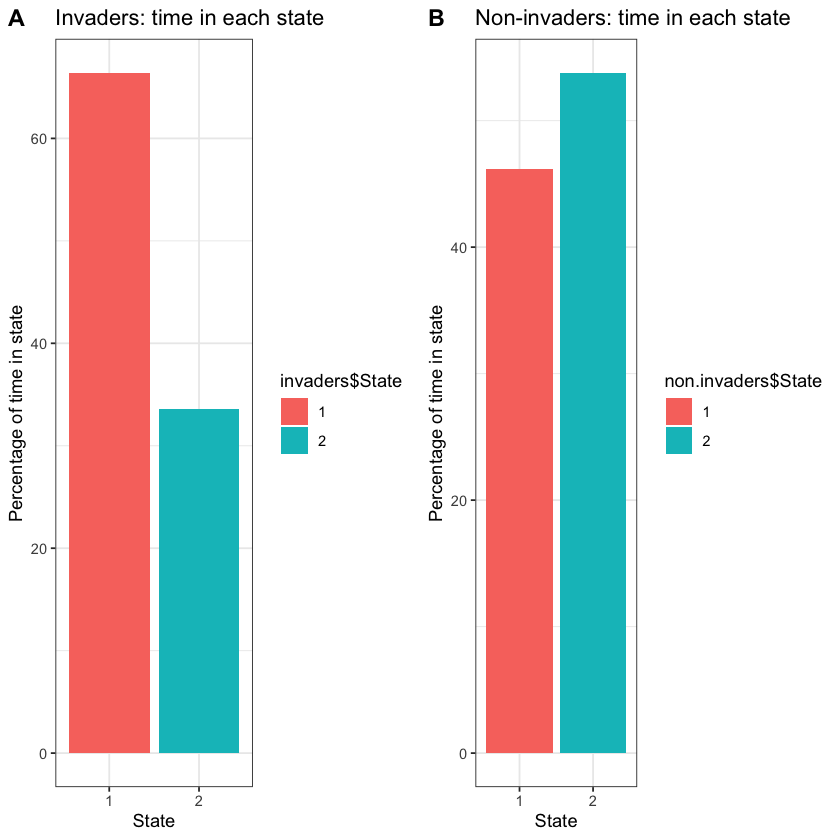

In [14]:
# Lets take a look on the proportion of time spent in state 1 or state 2 by invader/non-invader:
p1 <- ggplot(invaders, aes(x = invaders$State, fill = invaders$State)) + 
    theme_bw() + 
    geom_bar(aes(y = (..count..)/sum(..count..)*100)) + 
    labs(y = "Percentage of time in state", 
         x = "State",
         title = "Invaders: time in each state")

p2 <- ggplot(non.invaders, aes(x = non.invaders$State, fill = non.invaders$State)) + 
    theme_bw() + 
    geom_bar(aes(y = (..count..)/sum(..count..)*100)) + 
    labs(y = "Percentage of time in state", 
         x = "State",
         title = "Non-invaders: time in each state")
plot_grid(p1,p2, nrow=1,labels=c("A","B"))

Warning message in prepData(full.files, type = "UTM", coordNames = c("X", "Y")):
“There are 6 missing covariate values. Each will be replaced by the closest available value.”Warning message in nlm(nLogLike, wpar, nbStates, bounds, parSize, data, stepDist, :
“NA/Inf durch größte positive Zahl ersetzt”Warning message in nlm(nLogLike, wpar, nbStates, bounds, parSize, data, stepDist, :
“NA/Inf durch größte positive Zahl ersetzt”

Decoding states sequence... DONE


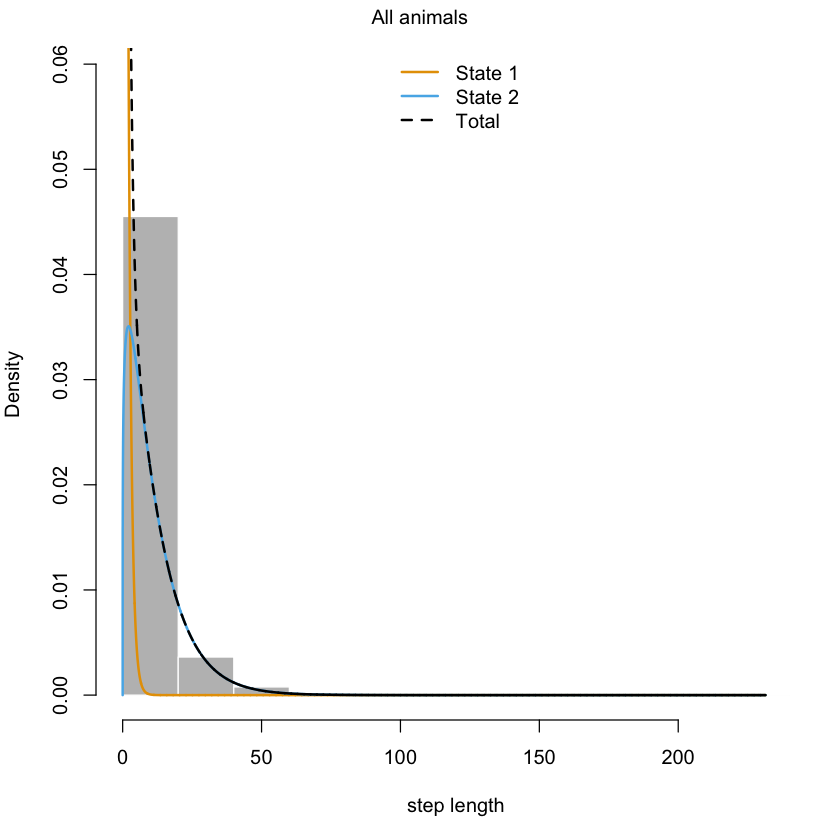

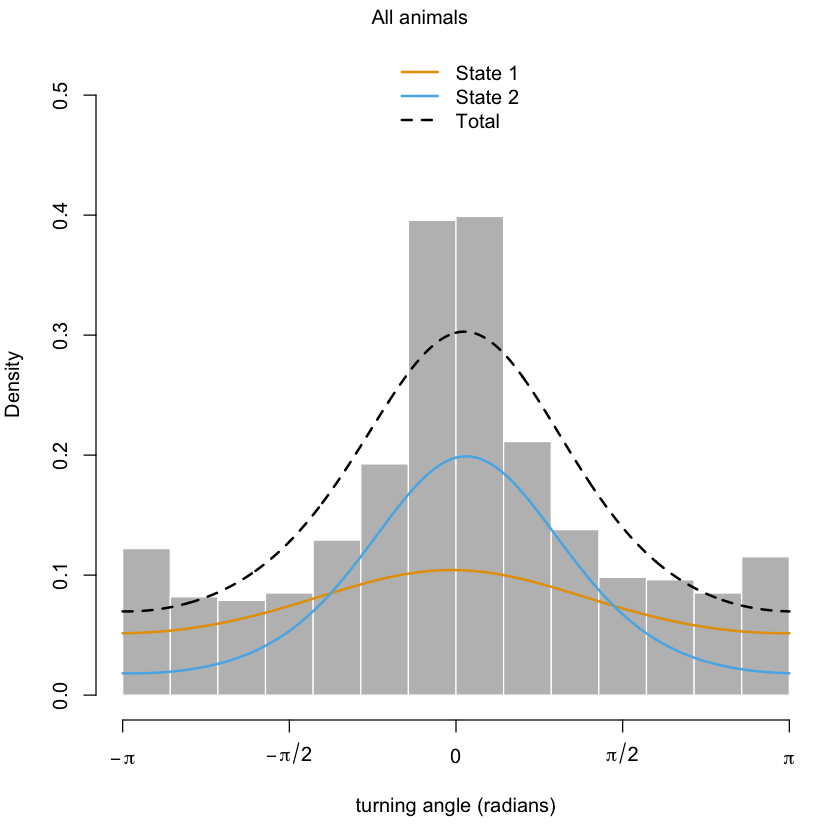

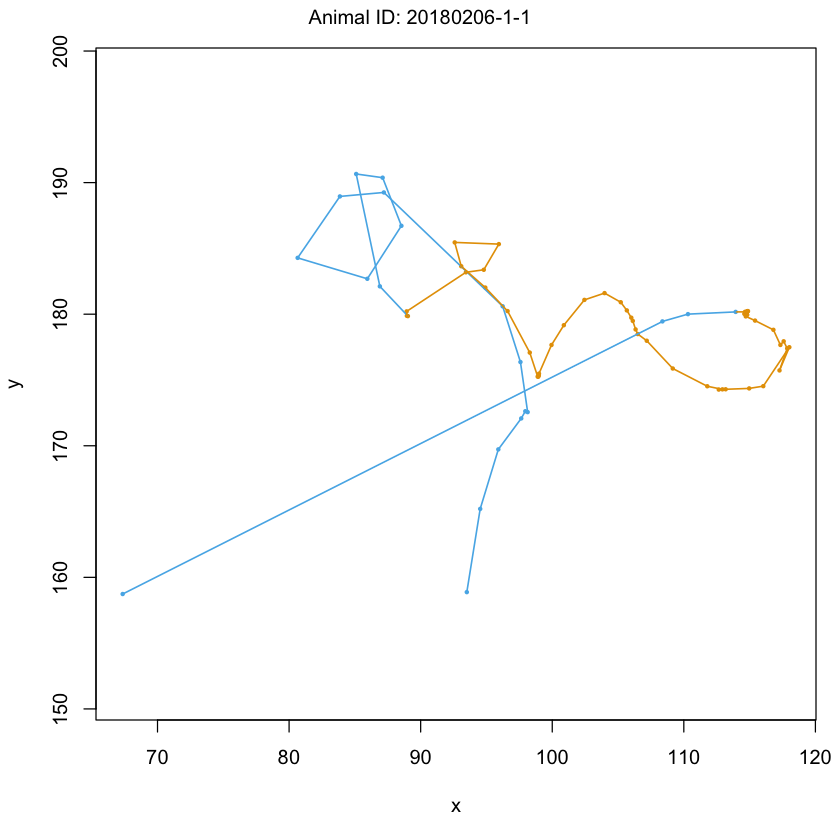

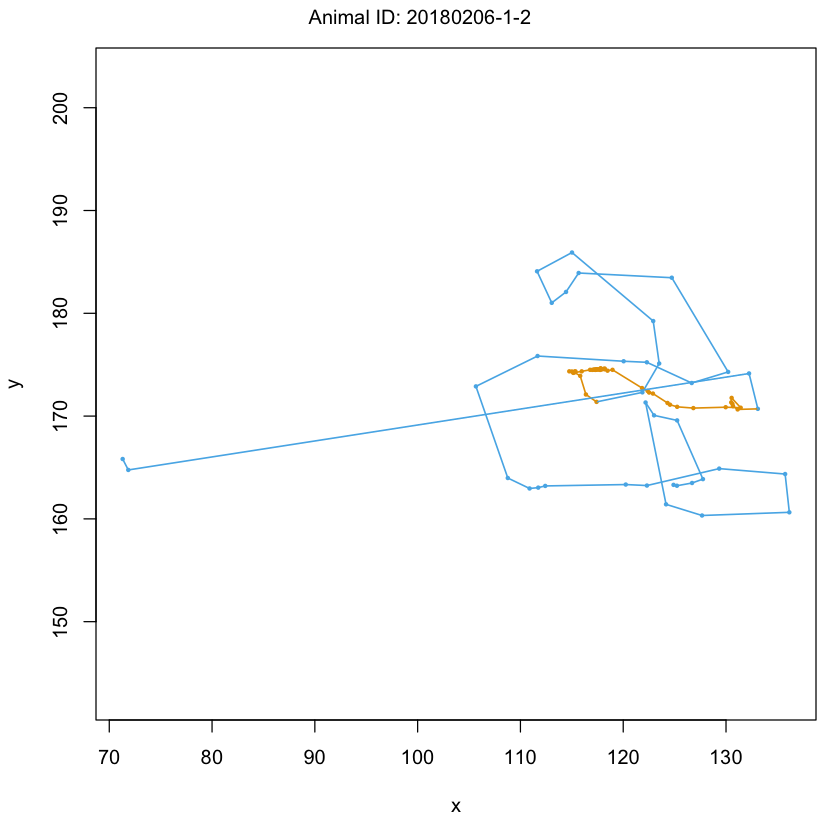

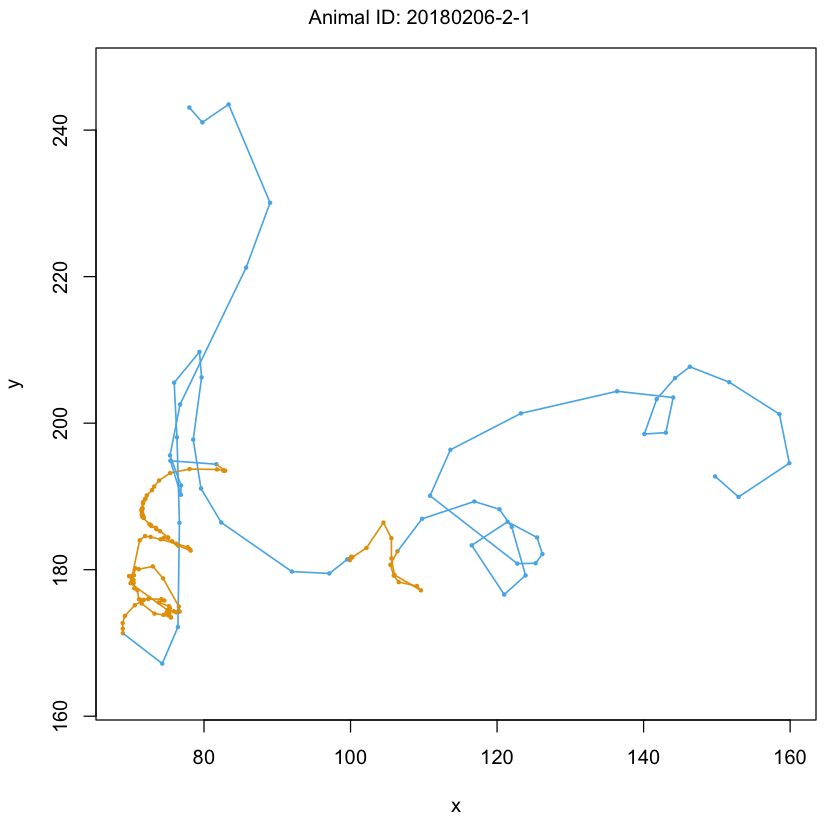

...

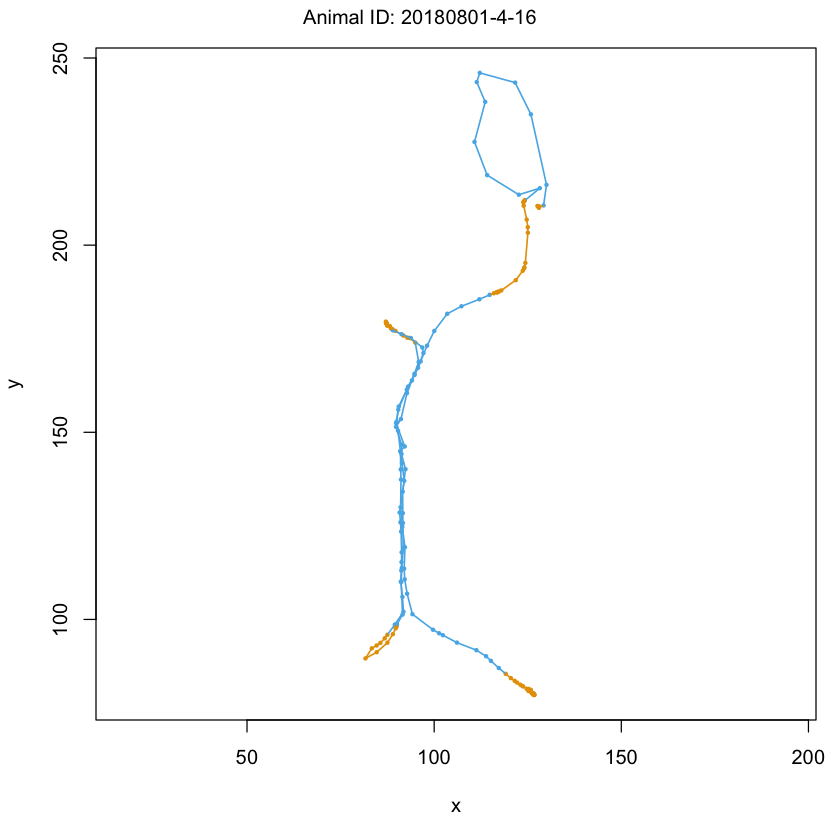

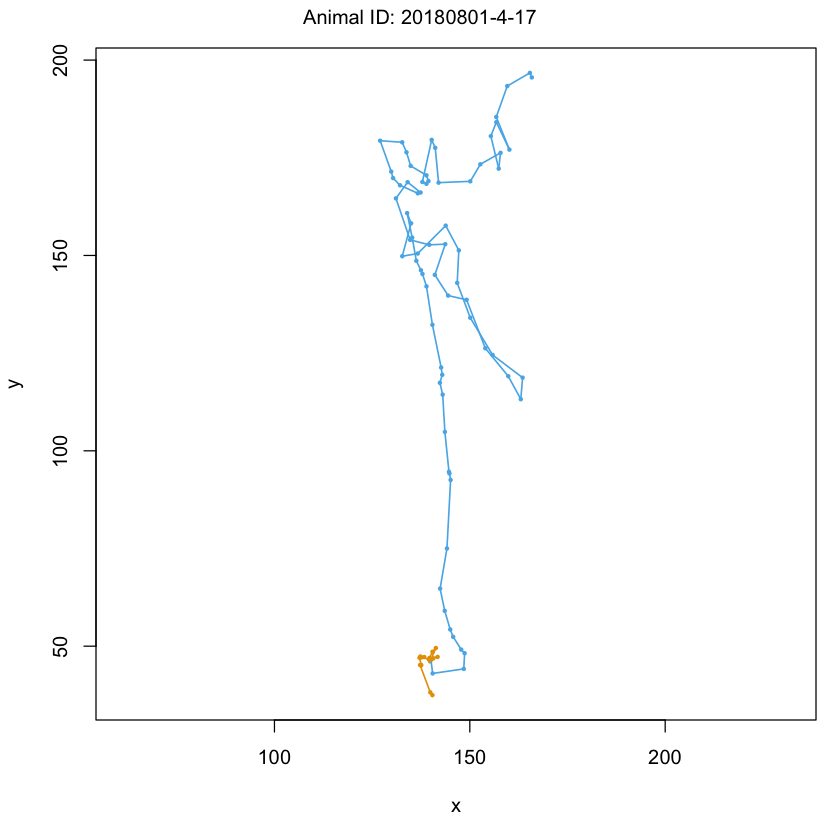

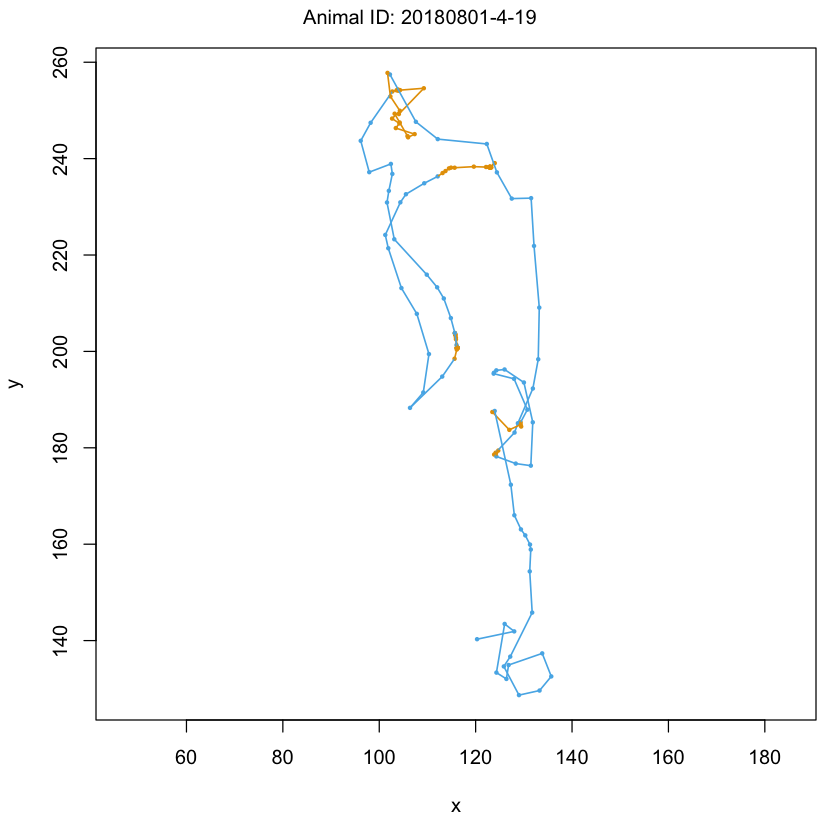

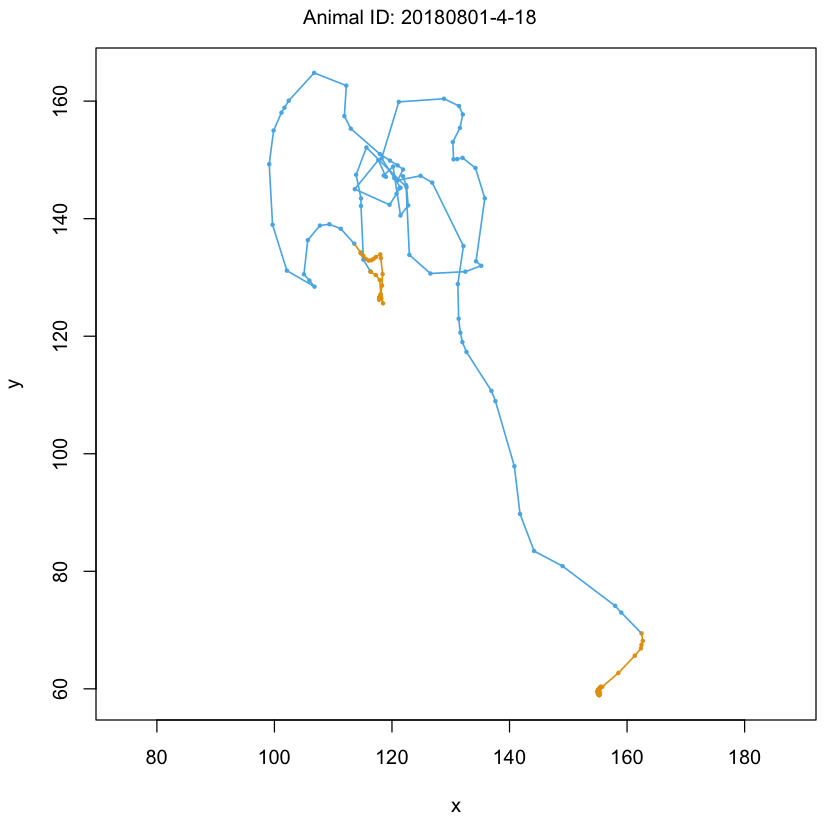

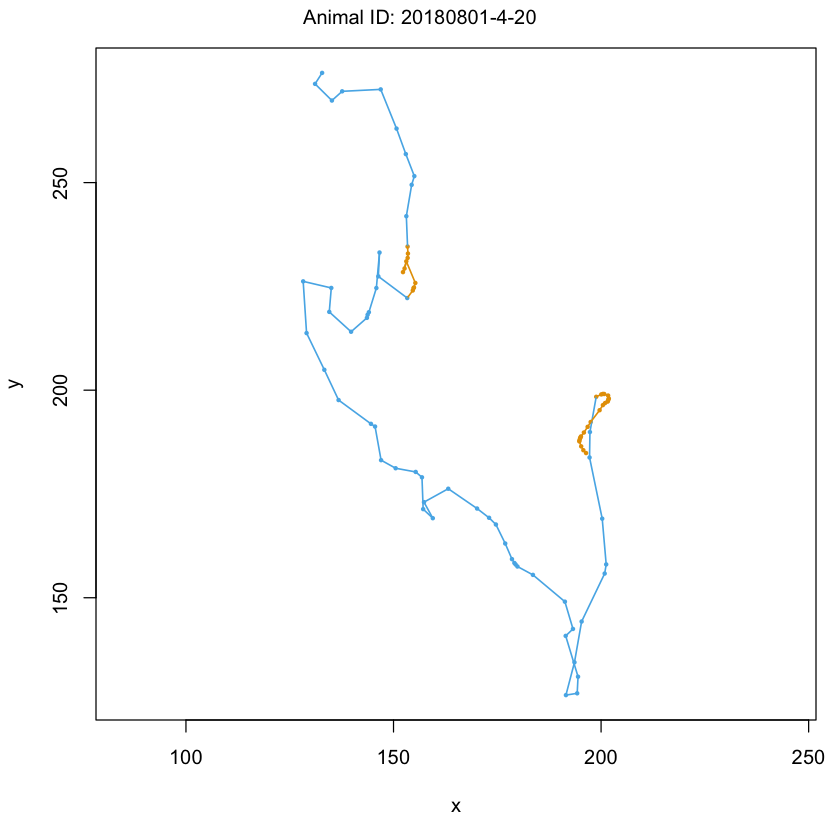

In [15]:
# the next files... can be all analyzed together since they do not have the distance to blood vessel feature
# and we already now which guys are invaders and which dont
full.files <- rbind(file_20180206, file_20180216, file_20180801)
#
# analyzing...
track.full.files <- prepData(full.files, type="UTM", coordNames = c("X", "Y"))
m.full.files <- fitHMM(data=track.full.files, nbStates=2, stepPar0=stepPar0, anglePar0=anglePar0)
# adding the info about the states to the dataframe now
m.full.files.states <- viterbi(m.full.files)
full.files$State <- as.factor(m.full.files.states)
track.full.files$State <- as.factor(m.full.files.states)
# plot
#pdf('combined-tables.pdf')
plot(m.full.files, plotCI=TRUE)
#dev.off()
#

In [16]:
# here I used some thresholds to avoid including the distances where the sporozoites entered the bloodstream... 
# this is why I swapped the fake distances with not a numbers (NA)
#p1 <- hist(append(invaders$StepX, invaders$StepY), 100, xlim = c(1,20))
#p2 <- hist(append(non.invaders$StepX, non.invaders$StepY), 100, xlim = c(1,20))
invaders$StepX[invaders$StepX > 20] <- NA
invaders$StepY[invaders$StepY > 20] <- NA
non.invaders$StepX[non.invaders$StepX > 20] <- NA
non.invaders$StepY[non.invaders$StepY > 20] <- NA

In [17]:
# now trying the power law analysis for invaders and non-invaders
# fixed several things... like the IDs, they were not working before.
all.steps.invaders1 <- c()
all.steps.invaders2 <- c()
pdf('invaders2.pdf')

parasite <- '1-2'
for (parasite in unique(invaders$ID)){
    peaks.x <- findPeaks(invaders$X[invaders$ID == parasite]) - 1
    peaks.y <- findPeaks(invaders$Y[invaders$ID == parasite]) - 1
    valleys.x <- findValleys(invaders$X[invaders$ID == parasite]) - 1
    valleys.y <- findValleys(invaders$Y[invaders$ID == parasite]) - 1
    peaks.x <- sort(c(peaks.x, valleys.x), decreasing = FALSE)
    peaks.y <- sort(c(peaks.y, valleys.y), decreasing = FALSE)
    step.invaders.x1 <- replicate(length(peaks.x) - 1, 0)
    step.invaders.y1 <- replicate(length(peaks.y) - 1, 0)
    step.invaders.x2 <- replicate(length(peaks.x) - 1, 0)
    step.invaders.y2 <- replicate(length(peaks.y) - 1, 0)    
    StepX.ind <- invaders$StepX[invaders$ID == parasite]
    StepY.ind <- invaders$StepY[invaders$ID == parasite]
    Cluster.ind <- as.numeric(invaders$ClusterID[invaders$ID == parasite])
    for(ind in c(1:(length(peaks.x) - 1)))
    {
        # If the next if passes, it means that the step we are computing is either pure state 1 or
        # pure state 2
        if (length(unique(Cluster.ind[peaks.x[ind]:peaks.x[ind + 1]])) == 1)
        {
            # If we are talking about state 1...
            if (Cluster.ind[peaks.x[1]] == 1)
            {
                # Now computing the step size in case state 1...
                step.invaders.x1[ind] = sum(StepX.ind[peaks.x[ind]:peaks.x[ind + 1]], na.rm=TRUE)
            }
            # Talking about state 2...
            if (Cluster.ind[peaks.x[1]] == 2)
            {
                step.invaders.x2[ind] = sum(StepX.ind[peaks.x[ind]:peaks.x[ind + 1]], na.rm=TRUE)
            }
        }
    }
    for(ind in c(1:(length(peaks.y) - 1)))
    {
        if (length(unique(Cluster.ind[peaks.y[ind]:peaks.y[ind + 1]])) == 1)
        {
            if (Cluster.ind[peaks.y[1]] == 1)
            {
                step.invaders.y1[ind] = sum(StepY.ind[peaks.y[ind]:peaks.y[ind + 1]], na.rm=TRUE)
            }
            if (Cluster.ind[peaks.y[1]] == 2)
            {
                step.invaders.y2[ind] = sum(StepY.ind[peaks.y[ind]:peaks.y[ind + 1]], na.rm=TRUE)
            }
        }
    }
    combined_steps1 <- c(step.invaders.x1,step.invaders.y1)
    combined_steps2 <- c(step.invaders.x2,step.invaders.y2)
    combined_steps1 <- combined_steps1[combined_steps1 > 0]
    combined_steps2 <- combined_steps2[combined_steps2 > 0]

    if (length(combined_steps1) > 30)
    {
        tt.pl <- conpl$new(combined_steps1[combined_steps1>0])
        tt.xmin <- estimate_xmin(tt.pl)
        tt.pl$setXmin(tt.xmin)
        text.plot <- paste('Invader, ', parasite, ', mu1 = ', num2str(tt.pl$pars), ', xmin1 = ', num2str(tt.pl$xmin), ', total_steps1 = ', num2str(length(combined_steps1)))
        plot(tt.pl, ylab=text.plot,
        xlab='Step length (1D)')
        lines(tt.pl, col=2, lwd=2)
    }
    if (length(combined_steps2) > 30)
    {
        tt.pl <- conpl$new(combined_steps2[combined_steps2>0])
        tt.xmin <- estimate_xmin(tt.pl)
        tt.pl$setXmin(tt.xmin)
        text.plot <- paste('Invader, ', parasite, ', mu2 = ', num2str(tt.pl$pars), ', xmin2 = ', num2str(tt.pl$xmin), ', total_steps2 = ', num2str(length(combined_steps1)))
        plot(tt.pl, ylab=text.plot,
        xlab='Step length (1D)')
        lines(tt.pl, col=3, lwd=2)
    }
    all.steps.invaders1 <- append(all.steps.invaders1, combined_steps1)
    all.steps.invaders2 <- append(all.steps.invaders2, combined_steps2)
}
# Combined stats state 1
tt.pl <- conpl$new(all.steps.invaders1[all.steps.invaders1>0])
tt.xmin <- estimate_xmin(tt.pl)
tt.pl$setXmin(tt.xmin)
text.plot <- paste('Invaders state 1', 'mu1 = ', num2str(tt.pl$pars), ', xmin1 = ', num2str(tt.pl$xmin), ', total_steps1 = ', num2str(length(all.steps.invaders1)))
plot(tt.pl, ylab=text.plot,
xlab='Step length (1D)')
lines(tt.pl, col=4, lwd=2)
# Combined stats state 2
#tt.pl <- conpl$new(all.steps.invaders2[all.steps.invaders2>0])
#tt.xmin <- estimate_xmin(tt.pl)
#tt.pl$setXmin(tt.xmin)
#text.plot <- paste('Invaders state 2', 'mu2 = ', num2str(tt.pl$pars), ', xmin2 = ', num2str(tt.pl$xmin), ', total_steps2 = ', num2str(length(all.steps.invaders2)))
#plot(tt.pl, ylab=text.plot,
#xlab='Step length (1D)')
#lines(tt.pl, col=5, lwd=2)
dev.off()

pdf 
  2

In [18]:
# now trying the power law analysis for non.invaders and non-non.invaders
# fixed several things... like the IDs, they were not working before.
all.steps.non.invaders1 <- c()
all.steps.non.invaders2 <- c()
pdf("non_invaders2.pdf")
parasite <- '1-2'
for (parasite in unique(non.invaders$ID)){
    peaks.x <- findPeaks(non.invaders$X[non.invaders$ID == parasite]) - 1
    peaks.y <- findPeaks(non.invaders$Y[non.invaders$ID == parasite]) - 1
    valleys.x <- findValleys(non.invaders$X[non.invaders$ID == parasite]) - 1
    valleys.y <- findValleys(non.invaders$Y[non.invaders$ID == parasite]) - 1
    peaks.x <- sort(c(peaks.x, valleys.x), decreasing = FALSE)
    peaks.y <- sort(c(peaks.y, valleys.y), decreasing = FALSE)
    step.non.invaders.x1 <- replicate(length(peaks.x) - 1, 0)
    step.non.invaders.y1 <- replicate(length(peaks.y) - 1, 0)
    step.non.invaders.x2 <- replicate(length(peaks.x) - 1, 0)
    step.non.invaders.y2 <- replicate(length(peaks.y) - 1, 0)    
    StepX.ind <- non.invaders$StepX[non.invaders$ID == parasite]
    StepY.ind <- non.invaders$StepY[non.invaders$ID == parasite]
    Cluster.ind <- as.numeric(non.invaders$ClusterID[non.invaders$ID == parasite])
    for(ind in c(1:(length(peaks.x) - 1)))
    {
        # If the next if passes, it means that the step we are computing is either pure state 1 or
        # pure state 2
        if (length(unique(Cluster.ind[peaks.x[ind]:peaks.x[ind + 1]])) == 1)
        {
            # If we are talking about state 1...
            if (Cluster.ind[peaks.x[1]] == 1)
            {
                # Now computing the step size in case state 1...
                step.non.invaders.x1[ind] = sum(StepX.ind[peaks.x[ind]:peaks.x[ind + 1]], na.rm=TRUE)
            }
            # Talking about state 2...
            if (Cluster.ind[peaks.x[1]] == 2)
            {
                step.non.invaders.x2[ind] = sum(StepX.ind[peaks.x[ind]:peaks.x[ind + 1]], na.rm=TRUE)
            }
        }
    }
    for(ind in c(1:(length(peaks.y) - 1)))
    {
        if (length(unique(Cluster.ind[peaks.y[ind]:peaks.y[ind + 1]])) == 1)
        {
            if (Cluster.ind[peaks.y[1]] == 1)
            {
                step.non.invaders.y1[ind] = sum(StepY.ind[peaks.y[ind]:peaks.y[ind + 1]], na.rm=TRUE)
            }
            if (Cluster.ind[peaks.y[1]] == 2)
            {
                step.non.invaders.y2[ind] = sum(StepY.ind[peaks.y[ind]:peaks.y[ind + 1]], na.rm=TRUE)
            }
        }
    }
    combined_steps1 <- c(step.non.invaders.x1,step.non.invaders.y1)
    combined_steps2 <- c(step.non.invaders.x2,step.non.invaders.y2)
    combined_steps1 <- combined_steps1[combined_steps1 > 0]
    combined_steps2 <- combined_steps2[combined_steps2 > 0]

    if (length(combined_steps1) > 30)
    {
        tt.pl <- conpl$new(combined_steps1[combined_steps1>0])
        tt.xmin <- estimate_xmin(tt.pl)
        tt.pl$setXmin(tt.xmin)
        text.plot <- paste('Non-Invader, ', parasite, ', mu1 = ', num2str(tt.pl$pars), ', xmin1 = ', num2str(tt.pl$xmin), ', total_steps1 = ', num2str(length(combined_steps1)))
        plot(tt.pl, ylab=text.plot,
        xlab='Step length (1D)')
        lines(tt.pl, col=2, lwd=2)
    }
    if (length(combined_steps2) > 30)
    {
        tt.pl <- conpl$new(combined_steps2[combined_steps2>0])
        tt.xmin <- estimate_xmin(tt.pl)
        tt.pl$setXmin(tt.xmin)
        text.plot <- paste('Non-Invader, ', parasite, ', mu2 = ', num2str(tt.pl$pars), ', xmin2 = ', num2str(tt.pl$xmin), ', total_steps2 = ', num2str(length(combined_steps2)))
        plot(tt.pl, ylab=text.plot,
        xlab='Step length (1D)')
        lines(tt.pl, col=3, lwd=2)
    }
    all.steps.non.invaders1 <- append(all.steps.non.invaders1, combined_steps1)
    all.steps.non.invaders2 <- append(all.steps.non.invaders2, combined_steps2)
    
}
# Combined stats state 1
tt.pl <- conpl$new(all.steps.non.invaders1[all.steps.non.invaders1>0])
tt.xmin <- estimate_xmin(tt.pl)
tt.pl$setXmin(tt.xmin)
text.plot <- paste('Non-Invaders state 1', 'mu1 = ', num2str(tt.pl$pars), ', xmin1 = ', num2str(tt.pl$xmin), ', total_steps1 = ', num2str(length(all.steps.non.invaders1)))
plot(tt.pl, ylab=text.plot,
xlab='Step length (1D)')
lines(tt.pl, col=4, lwd=2)
# Combined stats state 2
tt.pl <- conpl$new(all.steps.non.invaders2[all.steps.non.invaders2>0])
tt.xmin <- estimate_xmin(tt.pl)
tt.pl$setXmin(tt.xmin)
text.plot <- paste('Non-Invaders state 2', 'mu2 = ', num2str(tt.pl$pars), ', xmin2 = ', num2str(tt.pl$xmin), ', total_steps2 = ', num2str(length(all.steps.non.invaders2)))
plot(tt.pl, ylab=text.plot,
xlab='Step length (1D)')
lines(tt.pl, col=5, lwd=2)
dev.off()

pdf 
  2

In [19]:
all.steps.non.invaders <- c()
for (parasite in unique(non.invaders$ID)){
    peaks.x <- findPeaks(non.invaders$X[non.invaders$ID == parasite])
    peaks.y <- findPeaks(non.invaders$Y[non.invaders$ID == parasite])
    step.non.invaders.x <- replicate(length(peaks.x) - 1, 0)
    step.non.invaders.y <- replicate(length(peaks.y) - 1, 0)
    for(ind in c(1:(length(peaks.x) - 1))){
        step.non.invaders.x[ind] = sum(non.invaders$StepX[ind:ind + 1], na.rm=TRUE)
    }
    for(ind in c(1:(length(peaks.y) - 1))){
        step.non.invaders.y[ind] = sum(non.invaders$StepY[ind:ind + 1], na.rm=TRUE)
    }    
    all.steps.non.invaders <- append(all.steps.non.invaders, step.non.invaders.x)
    all.steps.non.invaders <- append(all.steps.non.invaders, step.non.invaders.y)
}

In [20]:
# now trying the power law analysis for invaders and non-invaders
# fixed several things... like the IDs, they were not working before.
all.steps.invaders <- c()
for (parasite in unique(invaders$ID)){
    peaks.x <- findPeaks(invaders$X[invaders$ID == parasite]) - 1
    peaks.y <- findPeaks(invaders$Y[invaders$ID == parasite]) - 1
    valleys.x <- findValleys(invaders$X[non.invaders$ID == parasite]) - 1
    valleys.y <- findValleys(invaders$Y[non.invaders$ID == parasite]) - 1
    peaks.x <- sort(c(peaks.x, valleys.x), decreasing = FALSE)
    peaks.y <- sort(c(peaks.y, valleys.y), decreasing = FALSE)
    step.invaders.x1 <- replicate(length(peaks.x) - 1, 0)
    step.invaders.y1 <- replicate(length(peaks.y) - 1, 0)
    step.invaders.x2 <- replicate(length(peaks.x) - 1, 0)
    step.invaders.y2 <- replicate(length(peaks.y) - 1, 0)    
    StepX.ind <- invaders$StepX[invaders$ID == parasite]
    StepY.ind <- invaders$StepY[invaders$ID == parasite]
    Cluster.ind <- invaders$ClusterID[invaders$ID == parasite]
    for(ind in c(1:(length(peaks.x) - 1))){
        if (length(unique(Cluster.ind[peaks.x[ind]]:[peaks.x[ind + 1]])) == 1)
            {
            if (as.integer(Cluster.ind[peaks.x[1]]) == 1)
                {
                step.invaders.x1[ind] = sum(StepX.ind[peaks.x[ind]:peaks.x[ind + 1]], na.rm=TRUE)
            }
            if (as.integer(Cluster.ind[peaks.x[1]]) == 2){
               step.invaders.x2[ind] = sum(StepX.ind[peaks.x[ind]:peaks.x[ind + 1]], na.rm=TRUE)
                }
        }
    }
    for(ind in c(1:(length(peaks.y) - 1))){
        if (length(unique(Cluster.ind[peaks.y[ind]]:Cluster.ind[peaks.y[ind + 1]])) == 1)
            {
            if (as.integer(Cluster.ind[peaks.y[1]]) == 1)
                {
                step.invaders.y1[ind] = sum(StepY.ind[peaks.y[ind]:peaks.y[ind + 1]], na.rm=TRUE)
            }
            if (as.integer(Cluster.ind[peaks.y[1]]) == 2){
               step.invaders.y2[ind] = sum(StepY.ind[peaks.y[ind]:peaks.y[ind + 1]], na.rm=TRUE)
                }
        }
    }
    combined_steps1 <- c(step.invaders.x1,step.invaders.y1)
    combined_steps2 <- c(step.invaders.x2,step.invaders.y2)

    if (length(combined_steps1) > 30){
        tt.pl <- conpl$new(combined_steps1[combined_steps1>0])
        tt.xmin <- estimate_xmin(tt.pl)
        tt.pl$setXmin(tt.xmin)
        print(tt.pl$pars)
        print(length(combined_steps1))
    }
    if (length(combined_steps2) > 30){
    tt.pl <- conpl$new(combined_steps2[combined_steps2>0])
    tt.xmin <- estimate_xmin(tt.pl)
    tt.pl$setXmin(tt.xmin)
    print(tt.pl$pars)
    print(length(combined_steps2))
}
}

ERROR: Error in parse(text = x, srcfile = src): <text>:19:53: Unerwartete(s) '['
18:     for(ind in c(1:(length(peaks.x) - 1))){
19:         if (length(unique(Cluster.ind[peaks.x[ind]]:[
                                                        ^


In [21]:
"myfindPeaks" <- 
function (x, thresh=0.05, span=0.25, lspan=0.05, noisey=TRUE)
{
  n <- length(x)
  y <- x
  mu.y.loc <- y
  if(noisey)
  {
    mu.y.loc <- (x[1:(n-2)] + x[2:(n-1)] + x[3:n])/3
    mu.y.loc <- c(mu.y.loc[1], mu.y.loc, mu.y.loc[n-2])
  }
  y.loess <- loess(x~I(1:n), span=span)
  y <- y.loess[[2]]
  sig.y <- var(y.loess$resid, na.rm=TRUE)^0.5
  DX.1 <- sign(diff(mu.y.loc, na.pad = FALSE))
  pks <- which(diff(DX.1, na.pad = FALSE) < 0 & DX.1[-(n-1)] > 0) + 1
  out <- pks
  if(noisey)
  {
    n.w <- floor(lspan*n/2)
    out <- NULL
    for(pk in pks)
    {
      inner <- (pk-n.w):(pk+n.w)
      outer <- c((pk-2*n.w):(pk-n.w),(pk+2*n.w):(pk+n.w))
      mu.y.outer <- mean(y[outer])
      if(!is.na(mu.y.outer)) 
        if (mean(y[inner])-mu.y.outer > thresh*sig.y) out <- c(out, pk)
    }
  }
  out
}

In [22]:
pks <- myfindPeaks(non.invaders$X[non.invaders$ID == '2-1'], thresh=0.05, span=0.25, lspan=0.05, noisey=TRUE)

ERROR: Error in y[outer]: nur Nullen dürfen mit negativen Indizes gemischt werden


In [23]:
non.invaders$X[non.invaders$ID == '2-1']

[1] 228.922 228.608 228.489 228.458 228.274 228.222 227.688 226.921 226.577
 [10] 230.661 234.549 235.997 235.892 235.836 235.538 235.742 241.152 245.068
 [19] 248.554 250.014 250.599 250.931 251.879 250.823 246.006 245.672 245.793
 [28] 246.079 247.216 242.335 237.297 232.379 230.197 224.484 223.111 222.869
 [37] 222.598 223.232 228.299 232.544 237.452 243.929 246.327 248.410 249.169
 [46] 249.083 246.152 238.552 231.938 228.103 222.973 222.079 222.158 221.735
 [55] 221.844 226.894 233.247 241.938 245.620 247.773 249.729 249.942 248.285
 [64] 238.833 230.813 225.280 222.840 222.727 222.359 222.078 221.892 221.780
 [73] 221.718 221.577 221.612 221.628 221.700 221.754 222.211 225.375 229.724
 [82] 239.396 246.751 247.589 249.349 250.130 250.493 249.213 247.777 245.935
 [91] 244.101 242.776 241.571 241.055 240.727 240.200 240.170 239.750 240.016
[100] 239.977 240.021 239.891 239.977 239.857 239.882 239.891 239.938 239.811
[109] 239.895 239.902 239.849 239.855 239.964 239.501 239.339 238.982 238.965
[118] 241.303 242.889 241.722 239.255 238.735 240.036 241.297 242.531 242.803
[127] 241.531 240.135 239.569 239.264 239.447 239.214 239.075 238.885 238.704
[136] 238.503 238.545 238.458 238.476 238.446 238.380 238.337 238.196 238.114
[145] 238.101 238.146 238.174 238.238 238.224 238.241 238.175 238.183 238.123
[154] 238.056 238.122 238.162 238.086 238.089 238.070 238.043 238.091 238.152
[163] 238.120 238.125 238.111 238.106 238.058 238.084 238.115 238.007 237.981
[172] 238.037 238.050 238.081 238.158 238.109 238.094 238.001 238.039 238.034
[181] 237.930 237.953 237.827 237.829 237.834 237.853 237.889 237.862 237.904
[190] 237.830 237.852 237.966 237.857 237.893 237.838 237.805 237.777 237.776
[199] 237.812 237.808 237.894 237.777 237.765 237.679 237.643 237.683 237.666
[208] 237.675 237.664 237.677 237.674 237.742 237.775 237.722 237.758 237.732
[217] 237.706 237.753 237.675 237.670 237.613 237.675 237.682 237.721 237.704
[226] 237.759 237.754 237.769 237.766 237.721 237.755 237.817 237.833 237.823
[235] 237.819 237.803 237.772 237.799 237.794 237.811 237.851 237.823 237.770
[244] 237.784 237.711 237.689 237.756 237.702 237.776 237.744 237.722 237.860
[253] 237.845 238.003 237.911 237.991 237.642 237.204 236.732 235.948 234.997
[262] 236.478 237.484 237.279 236.694 236.536 236.383 236.451 236.230 235.395
[271] 234.546 235.481 236.662 236.345 236.780 237.503 237.524 237.647 237.524
[280] 237.525 237.484 237.384 237.500 237.696 237.709 237.728 237.641 237.526
[289] 237.525 237.520 237.552 237.588 237.561 237.578 237.548 237.104 237.114
[298] 236.913 237.285 237.480 237.496 237.550 237.506 237.530 237.553 237.526
[307] 237.574 237.646 237.584 237.532 237.575 237.484 237.560 237.574 237.440
[316] 237.485